# Practical Session 2 Regression

## Necessary Imports

In [1]:
import numpy as np
import pylab as pl
import scipy as sp
import matplotlib.pyplot as plt
import sklearn 

## 2. Data visualization and pre-processing 

### Data Loading

In [2]:
data=np.load('ECoG.npz')
Xall=data.get('Xall')
Yall=data.get('Yall')
fe=data.get('Fe')
fe=int(fe[0][0])
print('Xall :',Xall.shape)
print('Yall :',Yall.shape)
print('Fe :',fe)

Xall : (3327, 64)
Yall : (3327, 1)
Fe : 50


##### Question 1: 

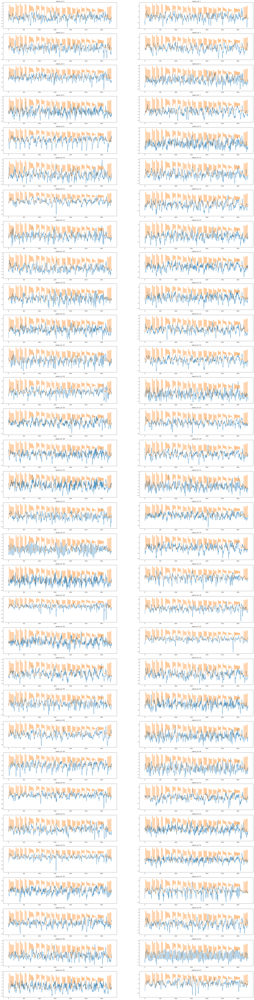

In [3]:
#first approach let's try to get the average per column. optain a data of the form 

nb_columns=Xall.shape[1]
plot_size=nb_columns//2

fig, axes = plt.subplots(nb_columns//2,2, figsize=(40, 160))
axes=axes.flatten()
for i in range(0,nb_columns):
    
    axes[i].plot(Xall[:,i])
    axes[i].plot(Yall)
    axes[i].set_title(f'signal_col: {i}')
        
#plt.tight_layout()
plt.show()


- 13 and 12 even 45 and 48

##### Question 2

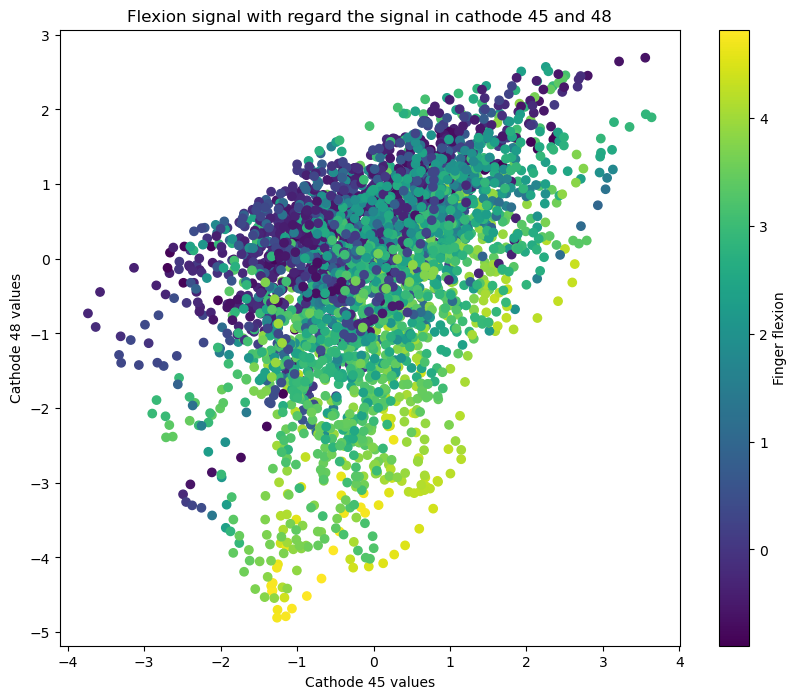

In [4]:
fig, ax = plt.subplots(figsize=(10, 8))

scatter=ax.scatter(Xall[:,45],Xall[:,48],c=Yall,vmin=Yall.min(),vmax=Yall.max())
fig.colorbar(scatter, ax=ax, label='Finger flexion')

ax.set_title('Flexion signal with regard the signal in cathode 45 and 48')
ax.set_xlabel('Cathode 45 values')
ax.set_ylabel('Cathode 48 values')

        
#plt.tight_layout()
plt.show()

In [5]:
test=Xall[:,45]-Xall[:,48]

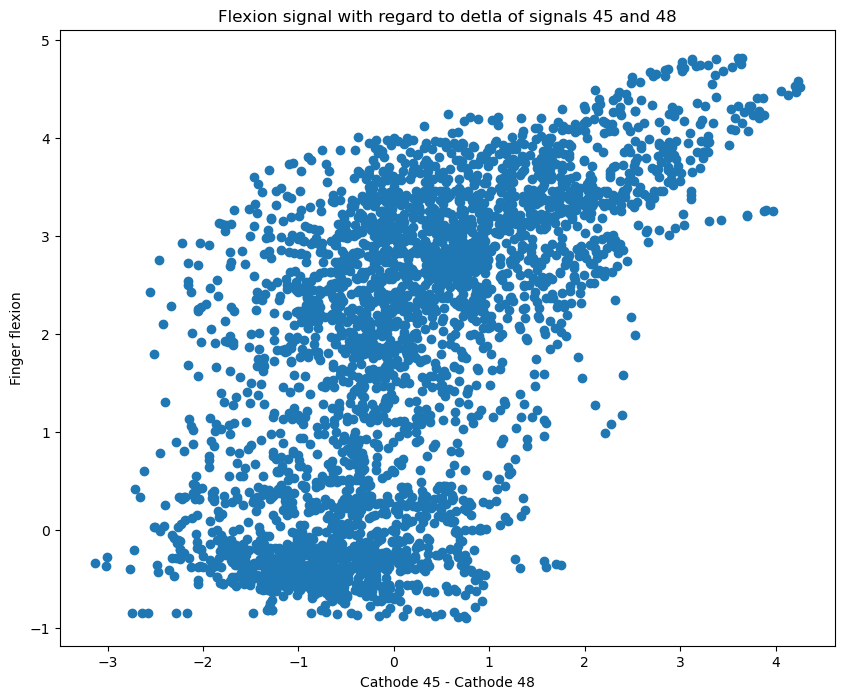

In [6]:
# j'ai voulu fair le malin mais bon 
fig, ax = plt.subplots(figsize=(10, 8))

scatter=ax.scatter(test,Yall)
#fig.colorbar(scatter, ax=ax, label='Finger flexion')

ax.set_title('Flexion signal with regard to detla of signals 45 and 48')
ax.set_xlabel('Cathode 45 - Cathode 48')
ax.set_ylabel('Finger flexion')

        
#plt.tight_layout()
plt.show()

##### Question 3 : split into training/test data

In [7]:
x_train=Xall[:1000,:]
x_test=Xall[1000:,:]
print('x_train shape: ',x_train.shape)
print('x_test shape: ',x_test.shape)

x_train shape:  (1000, 64)
x_test shape:  (2327, 64)


In [8]:
y_train=Yall[:1000]
y_test=Yall[1000:]
print('y_train shape: ',y_train.shape)
print('y_test: ',y_test.shape)

y_train shape:  (1000, 1)
y_test:  (2327, 1)


### Least Square Regression

#### Question 1

In [9]:
# add the bias to our X_hat
X_hat=np.concat((np.ones((x_train.shape[0],1)),x_train),axis=1)
X_hat.shape

(1000, 65)

#### Question 2: solve linearly the least square
- the derivative of the least square gives this:  
$$
\tilde{X}^T (\tilde{X} w - y) = 0
$$
$$
\tilde{X}^T\tilde{X} w= \tilde{X}^Ty

$$

Hence in the case of solve function we have: 
$$
A=\tilde{X}^T\tilde{X}
$$
$$
B=\tilde{X}^Ty
$$


In [10]:
A=np.dot(X_hat.T,X_hat)
B=np.dot(X_hat.T,y_train)

In [11]:
w_hat=np.linalg.solve(A,B)
print('w_hat shape: ',w_hat.shape)
b=w_hat[:1]
w=w_hat[1:]
print('b shape: ',b.shape)
print('w shape: ',w.shape)


w_hat shape:  (65, 1)
b shape:  (1, 1)
w shape:  (64, 1)


#### Question 3

(1000, 1)


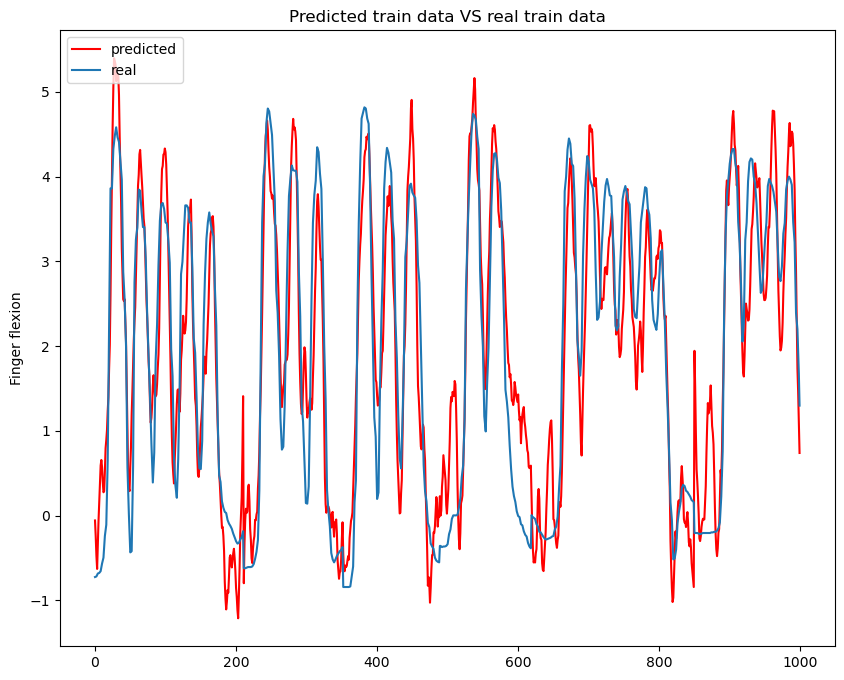

In [12]:
# test our weights on the training set
y_train_predict=np.dot(X_hat,w_hat)
print(y_train_predict.shape)

#plot with real values of training

fig, ax = plt.subplots(figsize=(10, 8))

ax.plot(y_train_predict,c='red',label='predicted')
ax.plot(y_train,label='real')
ax.legend(loc='upper left')

plt.title('Predicted train data VS real train data')
plt.ylabel('Finger flexion')
plt.show()


#clearly our prediction would be very close to our trainning data as we used that in our solving algorithm
# here we can also see that equation follows exactly all the oscilation of the curve (a clear sign of overfitting). we are following exactly the train data 
# not the trend seen in the trainning

(2327, 1)


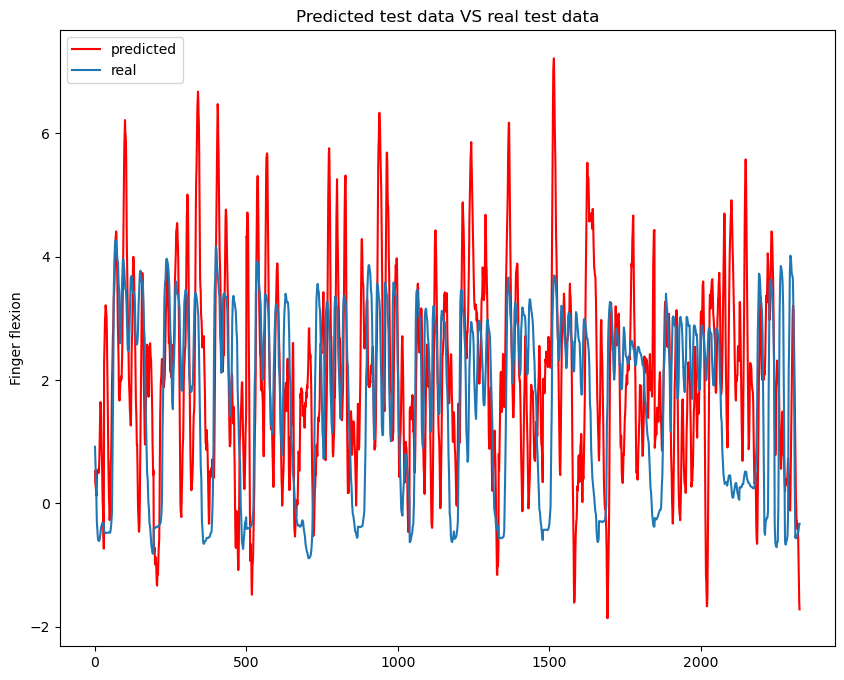

In [13]:
# test our weights on the training set
x_hat_test=np.concat((np.ones((x_test.shape[0],1)),x_test),axis=1)
y_test_predict=np.dot(x_hat_test,w_hat)
print(y_test_predict.shape)

#plot with real values of training

fig, ax = plt.subplots(figsize=(10, 8))

ax.plot(y_test_predict,c='red',label='predicted')
ax.plot(y_test,label='real')
ax.legend(loc='upper left')


plt.title('Predicted test data VS real test data')
plt.ylabel('Finger flexion')
plt.show()

#we can observe a clear sign that our model is overfitting since the performance wrt to test data isn't very good


#### Question 4

In [15]:
#MSE 
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('MSE score: ',mse)
print('R² score: ',r2)

# the mean squared error is around 3 hence the mean error is around 1.7 and for a flexion value comprised between -0.5 and 4 this is a very large 
#error. 
# same goes for a low R² score of -0.42 (it says that when it's negative the model perfroms worst then the base line when just using the avg.)

MSE score:  3.0455368767601607
R² score:  -0.4281700630222518


#### Question 5: Regression Model 

In [68]:
model=sklearn.linear_model.LinearRegression(fit_intercept=True)
model.fit(x_train,y_train)
print('training score: ',model.score(x_train,y_train))
print('Intercept :',model.intercept_)
print('model coeficient: ',model.coef_)
#model score regarding our train data, the fact that it's not 1 it means we 
# are not following our train data (so maybe less overfitting)

training score:  0.8395001217500111
Intercept : [1.90081255]
model coeficient:  [[-0.09150694  0.10861623 -0.07305774 -0.27938349  0.25112061  0.41213833
   0.14387528 -0.19811799  0.40869961  0.7059866  -0.4557358   0.02140866
   0.35947183 -0.01042572 -0.17655887 -0.03377368 -0.11345198 -0.72143135
  -0.5950915   0.23329595 -0.65132811 -0.33317441  0.28861537  0.24498034
   0.22062027  0.19042788  0.20709995  0.3273775  -0.65410592  0.11997444
  -0.07491945  0.10667581  0.11003235 -0.42910159 -0.22329342 -0.00381723
  -0.06046664 -0.1595164  -0.48519392  0.15019433  0.25855769 -0.09242374
   0.76314124 -0.0834797   0.04489988 -0.16816255  0.04845934  0.0256902
  -1.03905805  0.16060454 -0.19110549  0.16557271  0.08064689  0.27554638
  -0.01162067 -0.00740264  0.33850545  0.22409642 -0.2196636  -0.26866884
  -0.16469195 -0.23638421  0.04244268  0.5694358 ]]


In [ ]:
#check if all the elements are close by default these are the value of relative and absolute differnece  rtol=1.e-5, atol=1.e-8
print("\nIntercept close? ", np.allclose(w_hat[0], model.intercept_))
print("Coefficients close? ", np.allclose(w_hat[1:].flatten(), model.coef_.reshape(-1)))

In [100]:
regression_values=np.concat((model.intercept_,model.coef_.reshape(-1)),axis=0)


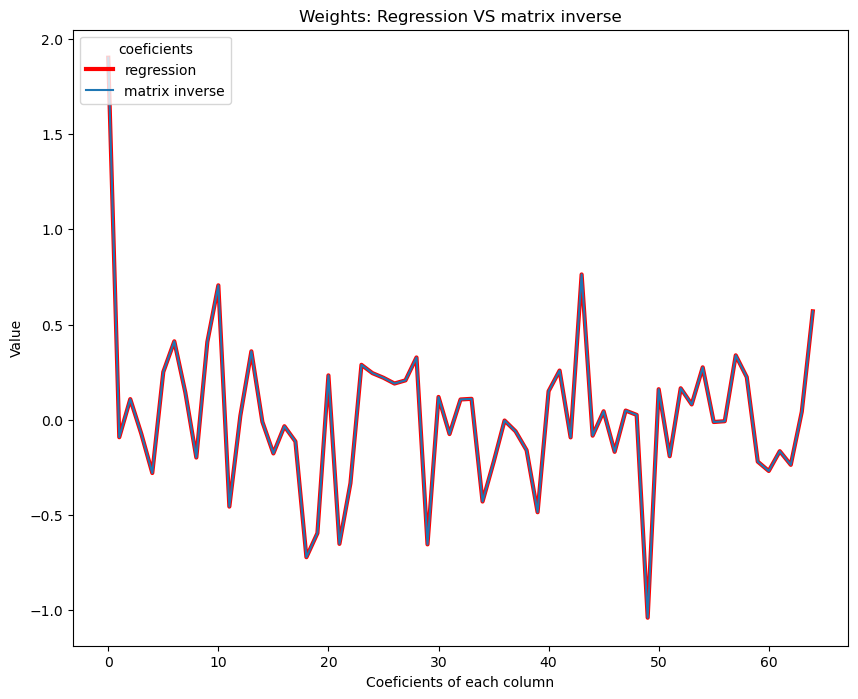

In [108]:
#plot with real values of training
fig, ax = plt.subplots(figsize=(10, 8))

ax.plot(regression_values,c='red',label='regression',lw=3)
ax.plot(w_hat,label='matrix inverse')
ax.legend(title='coeficients',loc='upper left')

plt.title('Weights: Regression VS matrix inverse')
plt.ylabel('Value')
plt.xlabel('Coeficients of each column')
plt.show()


### Ridge Regression